<a href="https://colab.research.google.com/github/ZPavlo/ClusteringComparing/blob/main/CURE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%matplotlib inline
import sys
import os
from google.colab import drive
drive.mount('/content/gdrive')
ROOT_DATA = '/content/gdrive/MyDrive/datasets/clustering_data'
SAVE_FORLDER = "/content/gdrive/MyDrive/datasets/images"

if not os.path.isdir(SAVE_FORLDER):
    os.mkdir(SAVE_FORLDER)

Mounted at /content/gdrive


In [2]:
!git clone https://github.com/ZPavlo/ClusteringComparing.git
sys.path.insert(0, "ClusteringComparing")

Cloning into 'ClusteringComparing'...
remote: Enumerating objects: 101, done.
remote: Counting objects: 100% (101/101), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 101 (delta 63), reused 57 (delta 25), pack-reused 0
Receiving objects: 100% (101/101), 1.83 MiB | 4.94 MiB/s, done.
Resolving deltas: 100% (63/63), done.


In [3]:
!cd SignClassifier && git pull

/bin/bash: line 0: cd: SignClassifier: No such file or directory


In [4]:
!pip install pyclustering
!pip install scikit-learn
!pip install sklearn_extras
!pip install scikit-learn-extra

     |████████████████████████████████| 2.6MB 8.8MB/s 
  Created wheel for pyclustering: filename=pyclustering-0.10.1.2-cp37-none-any.whl size=2395105 sha256=3e5d795d0d32b1312fdd5238a77a5e2320ec71e5f84b189aca35856efe7a5fc2
  Stored in directory: /root/.cache/pip/wheels/d4/98/57/2f53b94ccf47805e95e189e8a18f58a51ff61d67955b79c60d
Successfully built pyclustering
  Created wheel for sklearn-extras: filename=sklearn_extras-0.1.1-cp37-none-any.whl size=2206 sha256=cbb3eb964a93fbb66a85fe83b754924ca2f86bfd35aa7e2af4ca2810fa433af5
  Stored in directory: /root/.cache/pip/wheels/40/95/76/5c740a32631c60dd991fef0730234cd215f39acb898862a502
Successfully built sklearn-extras
     |████████████████████████████████| 1.7MB 6.7MB/s 
     |████████████████████████████████| 22.3MB 6.4MB/s 
  Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1


In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

sns.set()

## Datasets

In [6]:
from tools import make_plot

### Gaussian blobs

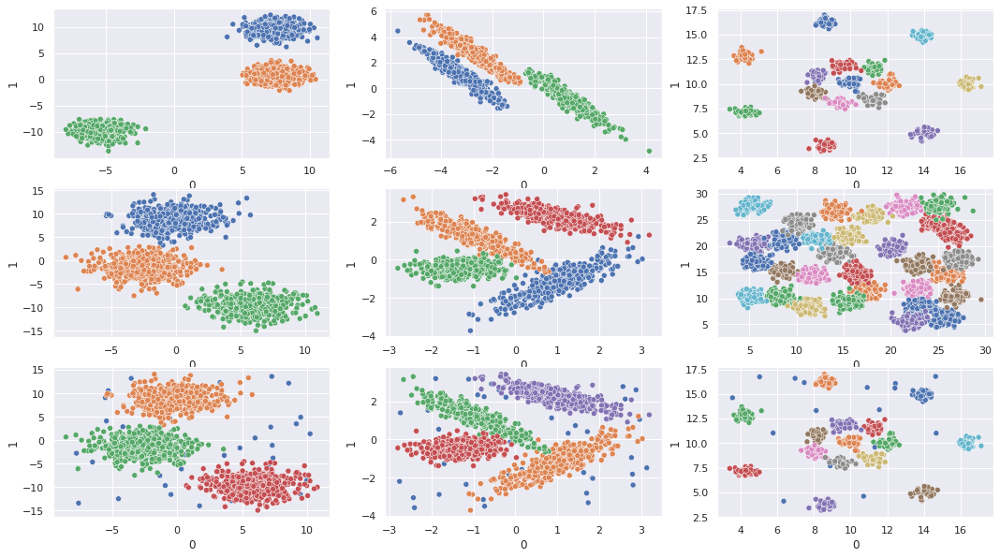

In [7]:
from datasets import get_data_blobs, get_data_blobs2, get_data_blobs3, \
                     get_data_blobs4, get_data_R15, get_data_d31, get_gaussian_data_3d, \
                     get_data_blobs2_noise, get_data_blobs4_noise, get_data_R15_noise, \
                     GAUSSIAN_BLOBS_DATA, GAUSSIAN_BLOBS_K 

fig, axes = plt.subplots(3, 3, figsize=(18, 10))

make_plot(*get_data_blobs(), axes=axes[0, 0])
make_plot(*get_data_blobs3(), axes=axes[0, 1])
make_plot(*get_data_R15(path=ROOT_DATA), axes=axes[0, 2])

make_plot(*get_data_blobs2(), axes=axes[1, 0])
make_plot(*get_data_blobs4(), axes=axes[1, 1])
make_plot(*get_data_d31(path=ROOT_DATA), axes=axes[1, 2])

make_plot(*get_data_blobs2_noise(), axes=axes[2, 0])
make_plot(*get_data_blobs4_noise(), axes=axes[2, 1])
make_plot(*get_data_R15_noise(path=ROOT_DATA), axes=axes[2, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "gaussian.png"))
plt.show()

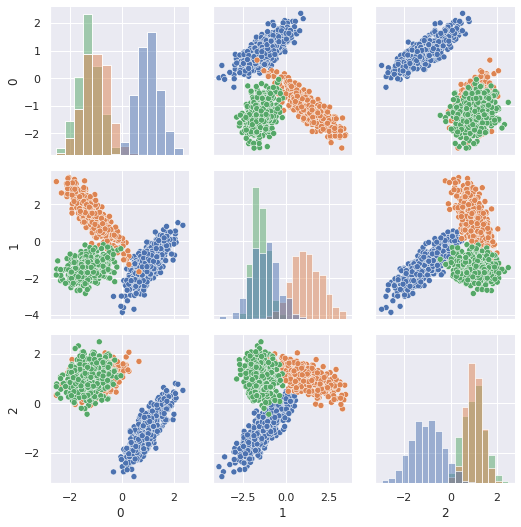

In [8]:
from tools import make_3d_plot

X, y = get_gaussian_data_3d()

df = pd.DataFrame(data=X)
df["cluster"] = y

g = sns.PairGrid(df, hue="cluster", palette="deep")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

plt.savefig(os.path.join(SAVE_FORLDER, "gaussian3d.png"))
plt.show()

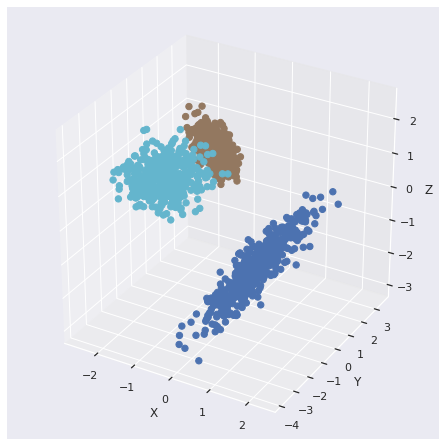

In [9]:
from tools import make_3d_plot

make_3d_plot(X, y)

### Unbalance Gaussian

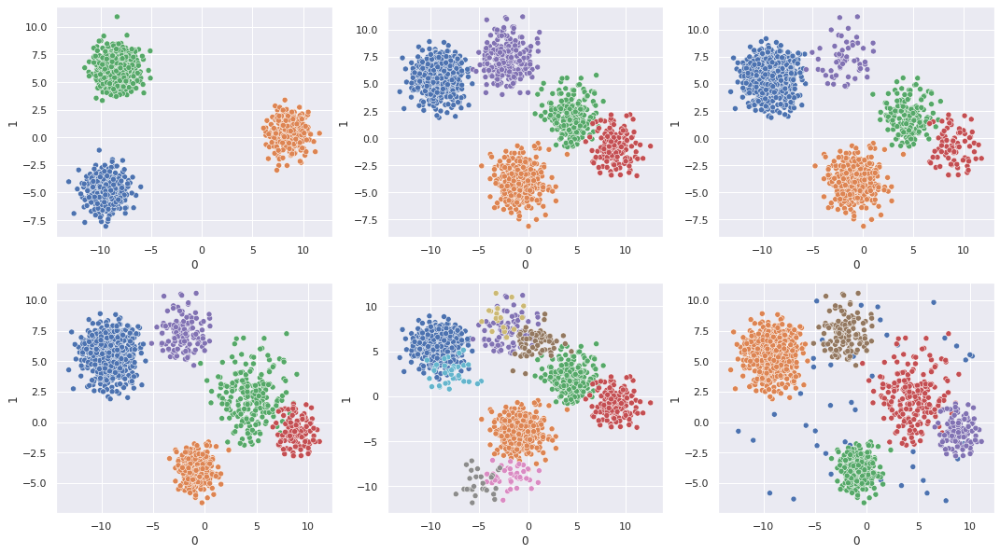

In [10]:
from datasets import get_data_unbalance1, get_data_unbalance2, get_data_unbalance3, \
                     get_data_unbalance4, get_data_unbalance5, get_data_unbalance6, \
                     UNBALANCED_GAUSSIAN_BLOBS_DATA, UNBALANCED_GAUSSIAN_BLOBS_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_unbalance1(), axes=axes[0, 0])
make_plot(*get_data_unbalance2(), axes=axes[0, 1])
make_plot(*get_data_unbalance3(), axes=axes[0, 2])
make_plot(*get_data_unbalance4(), axes=axes[1, 0])
make_plot(*get_data_unbalance5(), axes=axes[1, 1])
make_plot(*get_data_unbalance6(), axes=axes[1, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "unbalance gaussian.png"))
plt.show()

### Cube 

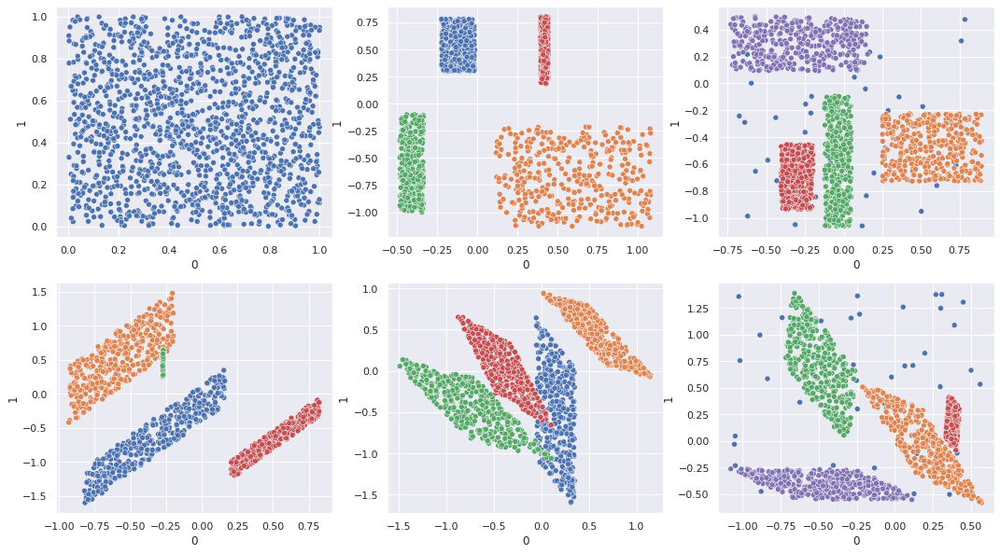

In [11]:
from datasets import get_data_cube, get_data_cube2, get_data_cube3, \
                     get_data_cube4, get_data_cube5, get_data_cube6, \
                     get_data_cube_3d, CUBES_RECT_PARALLEL_DATA, CUBES_RECT_PARALLEL_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_cube(), axes=axes[0, 0])
make_plot(*get_data_cube2(), axes=axes[0, 1])
make_plot(*get_data_cube3(), axes=axes[1, 0])
make_plot(*get_data_cube4(), axes=axes[1, 1])
make_plot(*get_data_cube5(), axes=axes[0, 2])
make_plot(*get_data_cube6(), axes=axes[1, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "cube.png"))
plt.show()

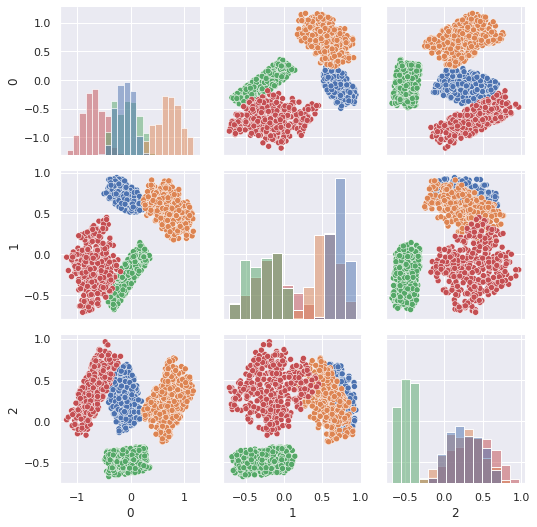

In [12]:
X, y = get_data_cube_3d()

df = pd.DataFrame(data=X)
df["cluster"] = y

g = sns.PairGrid(df, hue="cluster", palette="deep")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

plt.savefig(os.path.join(SAVE_FORLDER, "cube3d.png"))
plt.show()

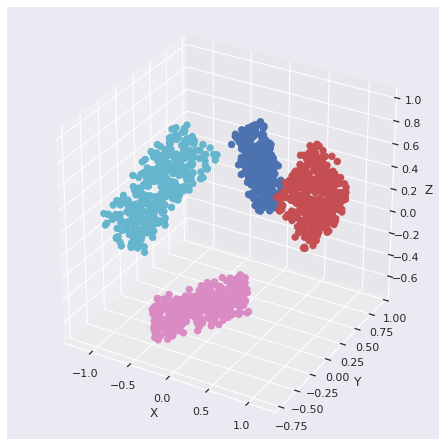

In [13]:
make_3d_plot(X, y)

### Non-spherical

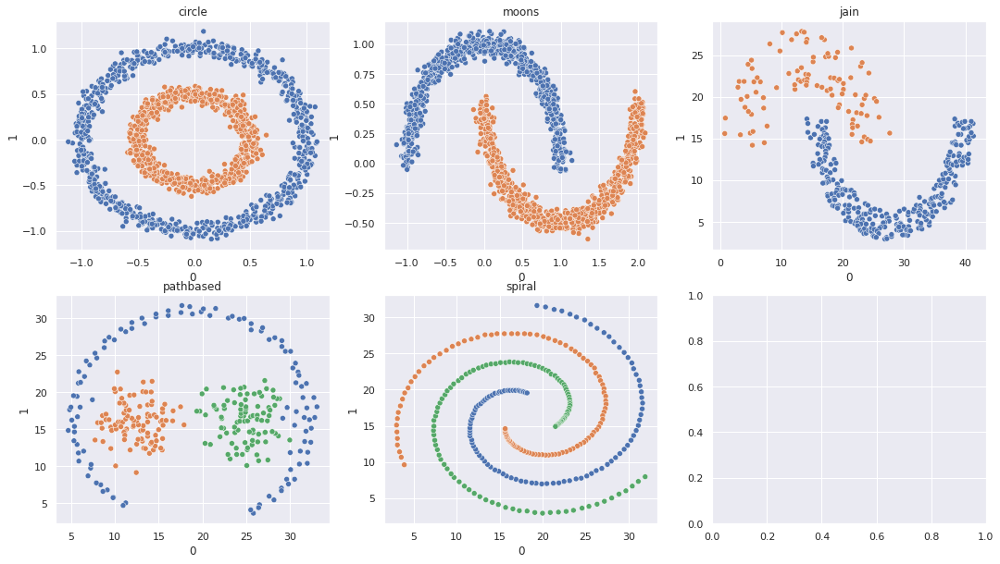

In [14]:
from datasets import get_data_circle, get_data_moons, get_data_jain, \
                     get_data_pathbased, get_data_spiral, NON_SPHERICAL_DATA, \
                     NON_SPHERICAL_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_circle(), axes=axes[0, 0], title="circle")
make_plot(*get_data_moons(), axes=axes[0, 1], title="moons")
make_plot(*get_data_jain(path=ROOT_DATA), axes=axes[0, 2], title="jain")
make_plot(*get_data_pathbased(path=ROOT_DATA), axes=axes[1, 0], title="pathbased")
make_plot(*get_data_spiral(path=ROOT_DATA), axes=axes[1, 1], title="spiral")

plt.savefig(os.path.join(SAVE_FORLDER, "non-spherical.png"))
plt.show()

### Combining forms

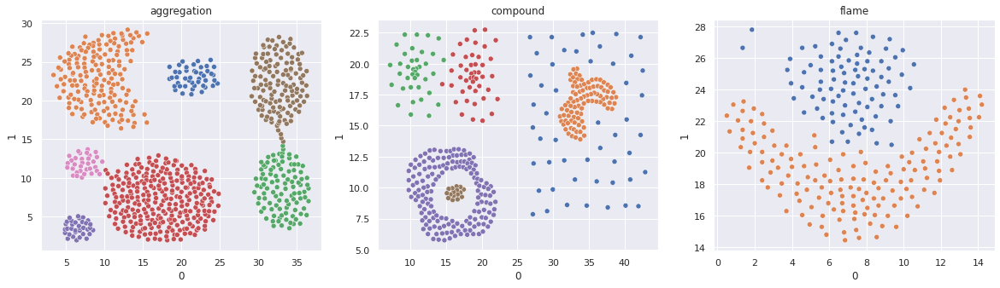

In [15]:
from datasets import get_data_aggregation, get_data_compound, get_data_flame, \
                     get_data_cube, OTHER_FORMS_DATA, OTHER_FORMS_K



fig, axes = plt.subplots(1, 3, figsize=(20, 5))

make_plot(*get_data_aggregation(path=ROOT_DATA), axes=axes[0], title="aggregation")
make_plot(*get_data_compound(path=ROOT_DATA), axes=axes[1], title="compound")
make_plot(*get_data_flame(path=ROOT_DATA), axes=axes[2], title="flame")

plt.savefig(os.path.join(SAVE_FORLDER, "combining forms.png"))
plt.show()

## Data clustering

In [16]:
import numpy as np

from cure_utils import run_CURE_on_data_with_K, run_CURE_on_data, run_on_3d_data

In [18]:
import os

if not os.path.exists(os.path.join(ROOT_DATA, "images")):
    os.mkdir(os.path.join(ROOT_DATA, "images"))

### Gaussian blobs

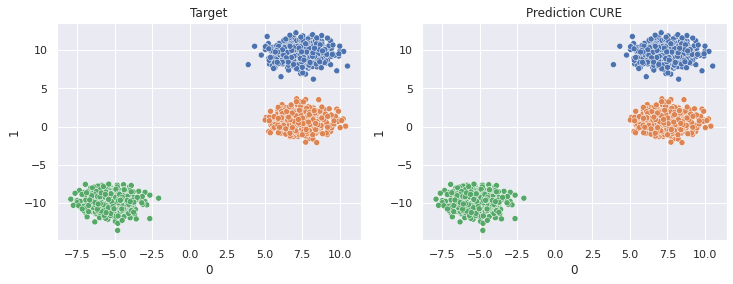

[CURE]: accuracy 1.0000, time 0.272, mem 0.001Mb


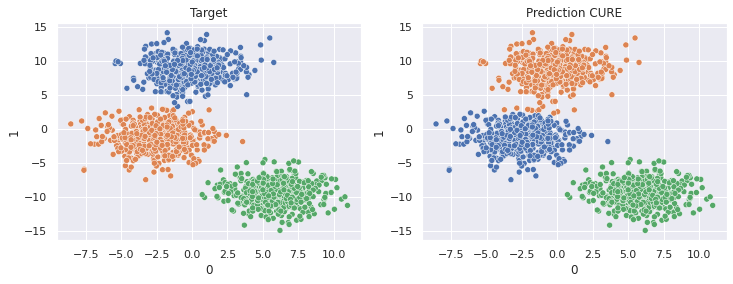

[CURE]: accuracy 0.9912, time 0.167, mem 0.002Mb


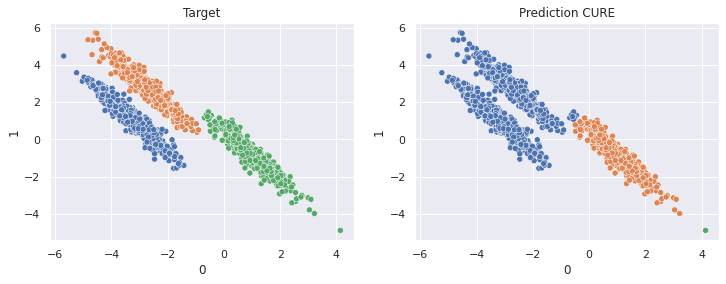

[CURE]: accuracy 0.7666, time 0.181, mem 0.002Mb


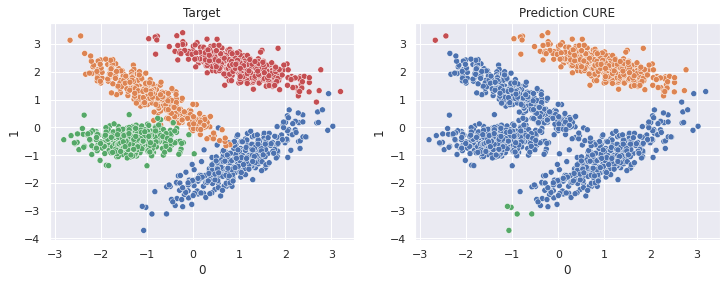

[CURE]: accuracy 0.6244, time 0.164, mem 0.002Mb


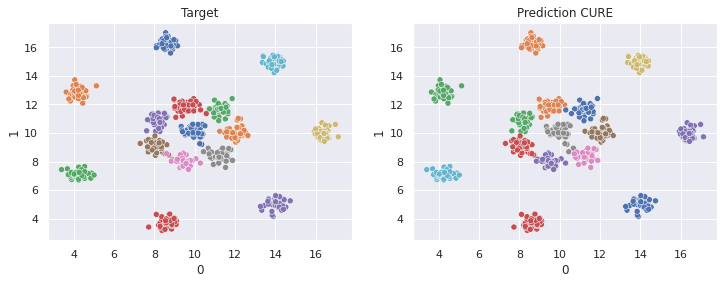

[CURE]: accuracy 0.9978, time 0.163, mem 0.001Mb


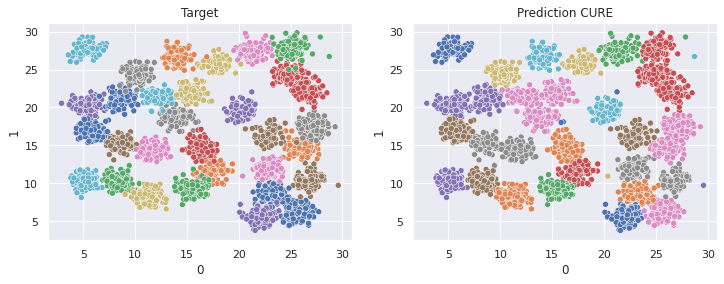

[CURE]: accuracy 0.9831, time 0.565, mem 0.001Mb


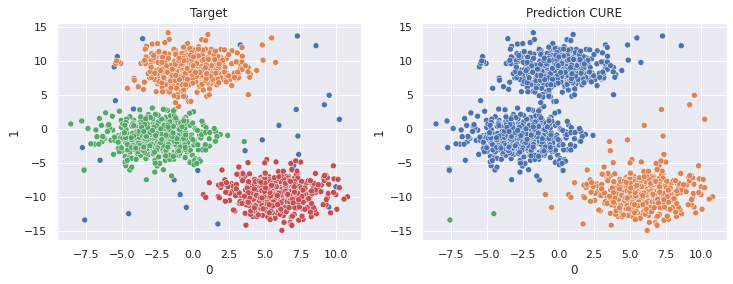

[CURE]: accuracy 0.7614, time 0.175, mem 0.002Mb


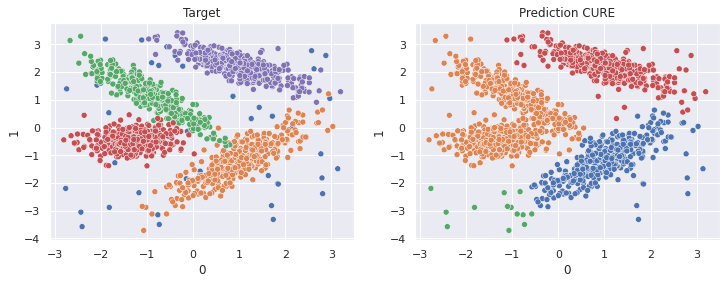

[CURE]: accuracy 0.8600, time 0.177, mem 0.002Mb


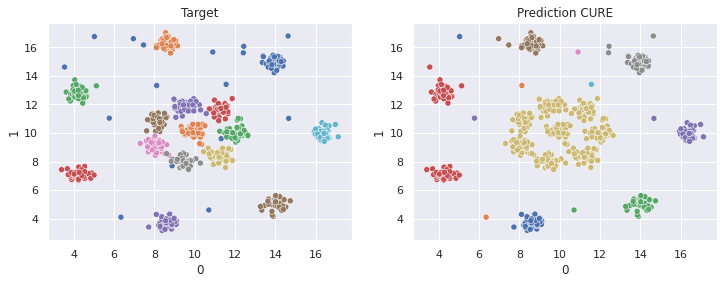

[CURE]: accuracy 0.7590, time 0.060, mem 0.001Mb


In [19]:
run_CURE_on_data_with_K(GAUSSIAN_BLOBS_DATA, GAUSSIAN_BLOBS_K, "GAUSSIAN_BLOBS", path=ROOT_DATA)

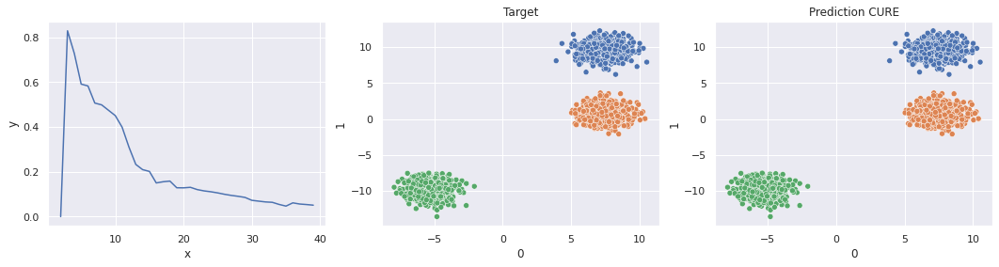

Best K = 3
[CURE]: accuracy 1.0000


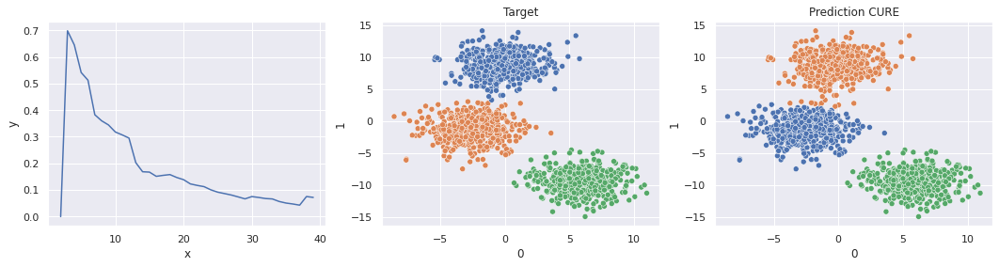

Best K = 3
[CURE]: accuracy 0.9912


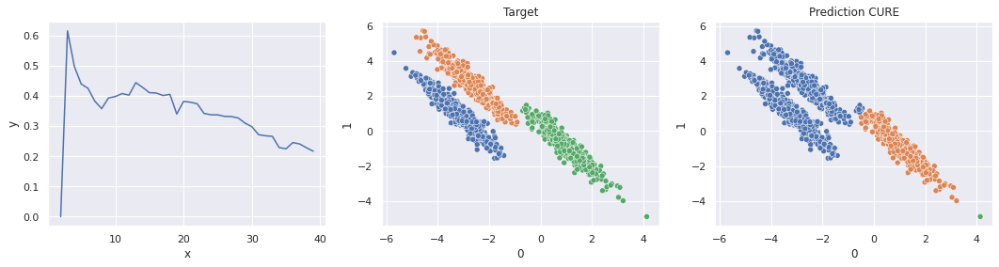

Best K = 3
[CURE]: accuracy 0.7666


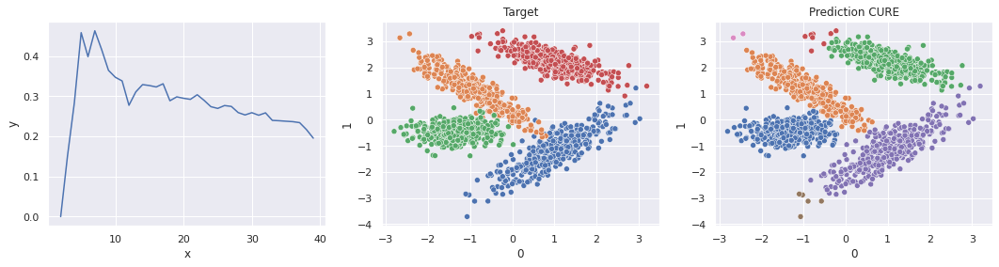

Best K = 7
[CURE]: accuracy 0.9865


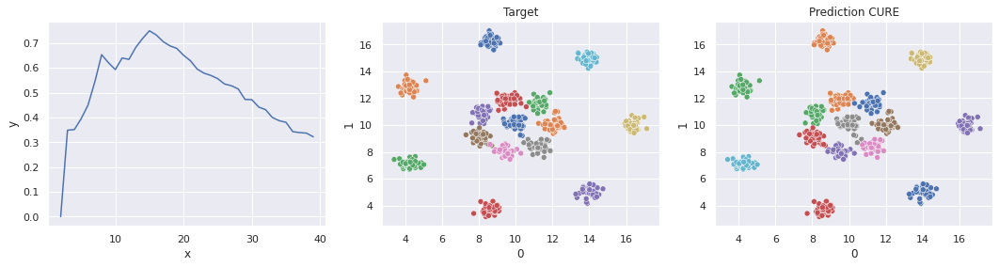

Best K = 15
[CURE]: accuracy 0.9978


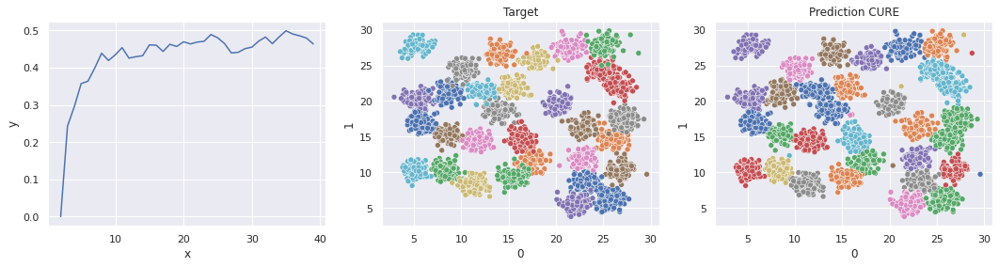

Best K = 35
[CURE]: accuracy 0.9908


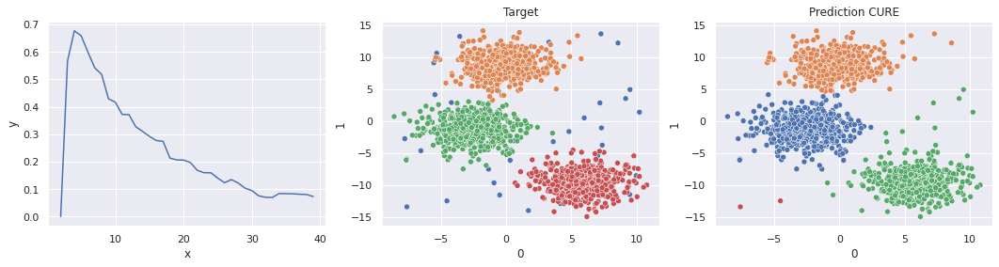

Best K = 4
[CURE]: accuracy 0.9765


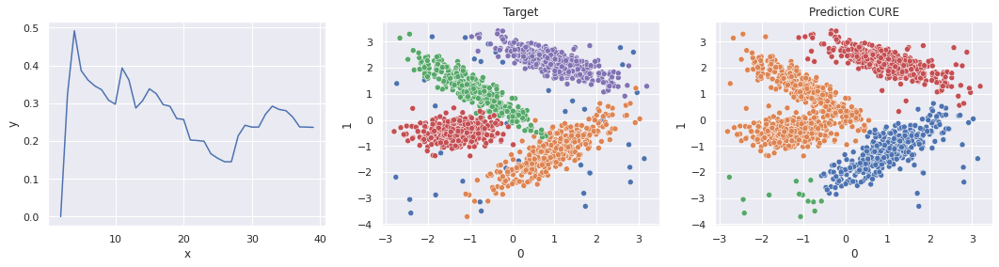

Best K = 4
[CURE]: accuracy 0.8600


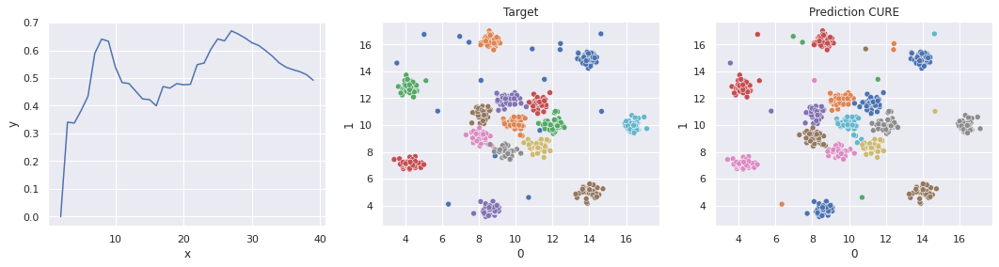

Best K = 27
[CURE]: accuracy 0.9963


In [20]:
run_CURE_on_data(GAUSSIAN_BLOBS_DATA, list(range(2, 40)), "GAUSSIAN_BLOBS", path=ROOT_DATA)

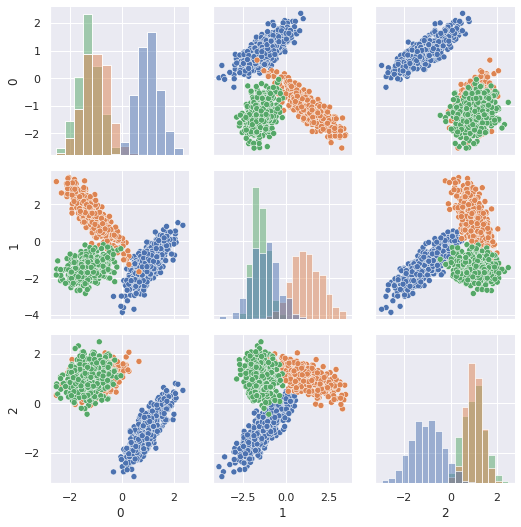

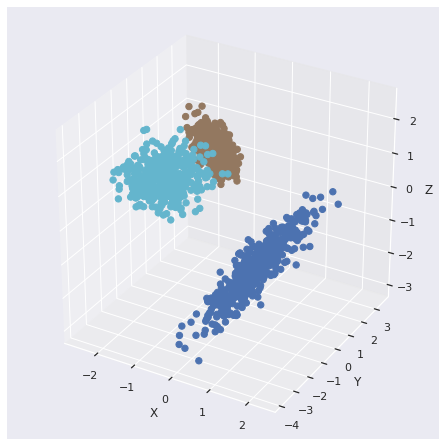

[CURE]: accuracy 0.9809, time 0.203, mem 0.001Mb


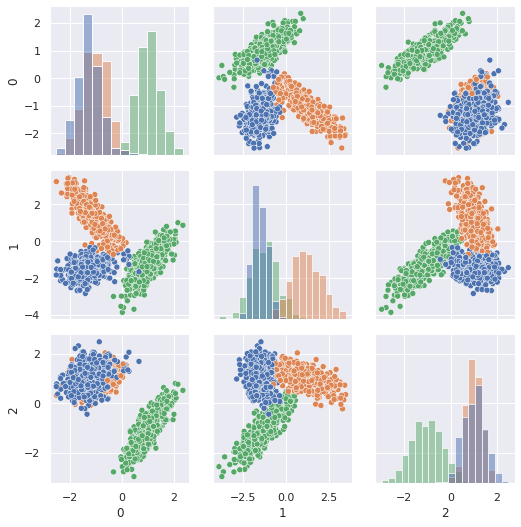

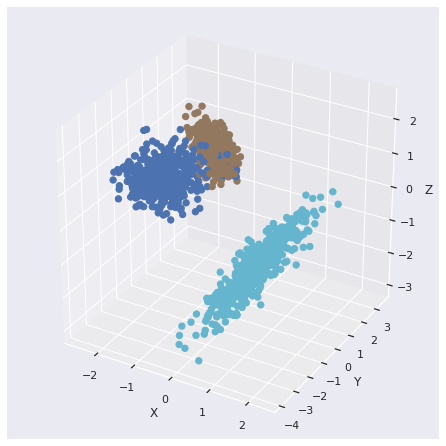

In [21]:
X, y = get_gaussian_data_3d()

run_on_3d_data(X, y, K=3, data_name="GAUSSIAN_BLOBS", path=ROOT_DATA)

### Unbalance Gaussian

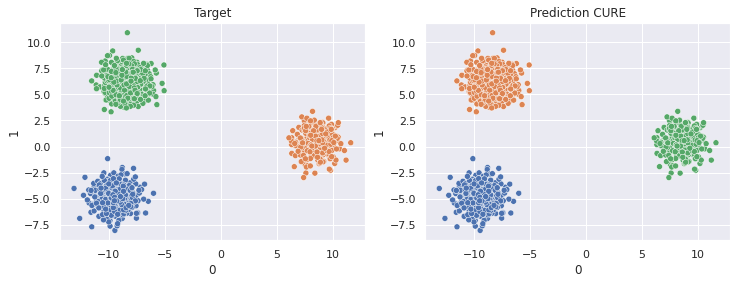

[CURE]: accuracy 1.0000, time 0.181, mem 0.001Mb


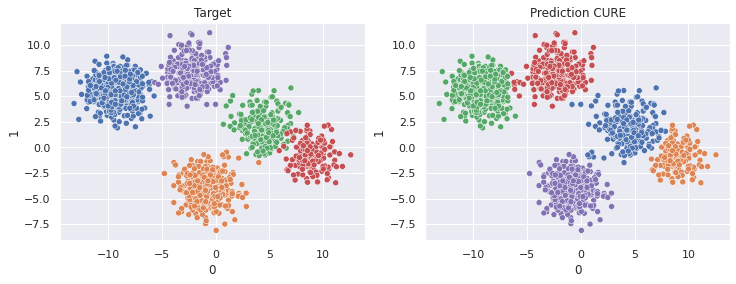

[CURE]: accuracy 0.9891, time 0.161, mem 0.002Mb


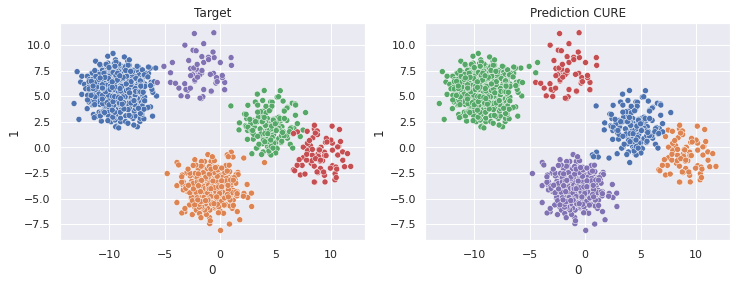

[CURE]: accuracy 0.9930, time 0.172, mem 0.002Mb


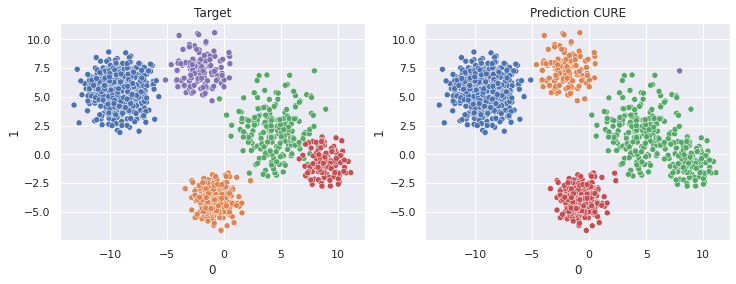

[CURE]: accuracy 0.9783, time 0.177, mem 0.002Mb


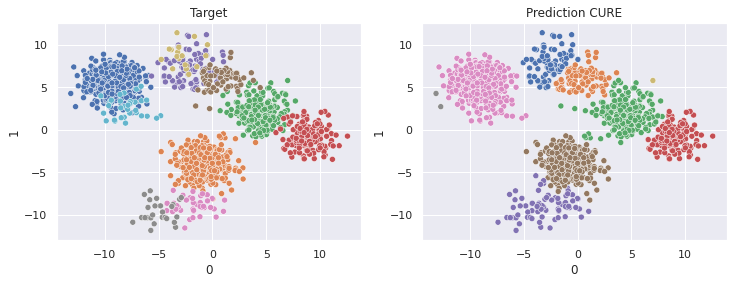

[CURE]: accuracy 0.9674, time 0.181, mem 0.002Mb


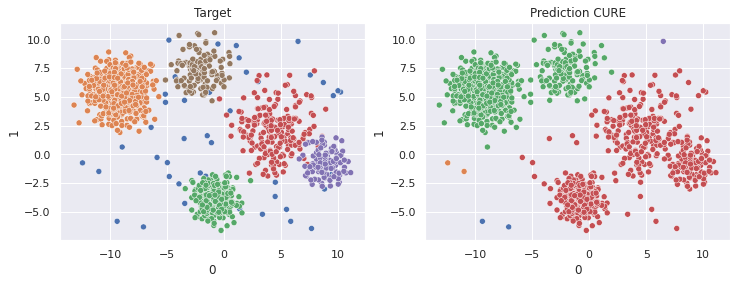

[CURE]: accuracy 0.7785, time 0.178, mem 0.002Mb


In [22]:
run_CURE_on_data_with_K(UNBALANCED_GAUSSIAN_BLOBS_DATA, UNBALANCED_GAUSSIAN_BLOBS_K, "UNBALANCED_GAUSSIAN_BLOBS", path=ROOT_DATA)

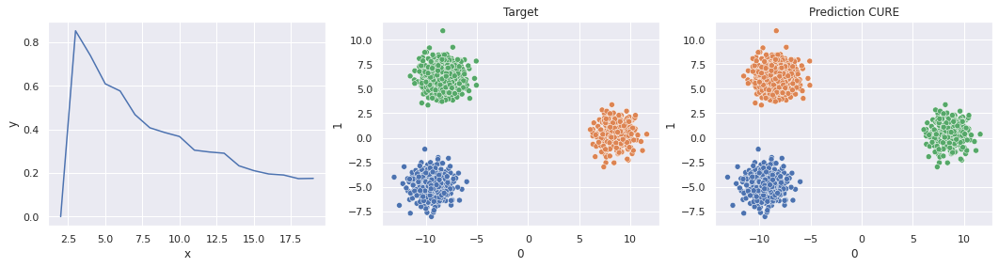

Best K = 3
[CURE]: accuracy 1.0000


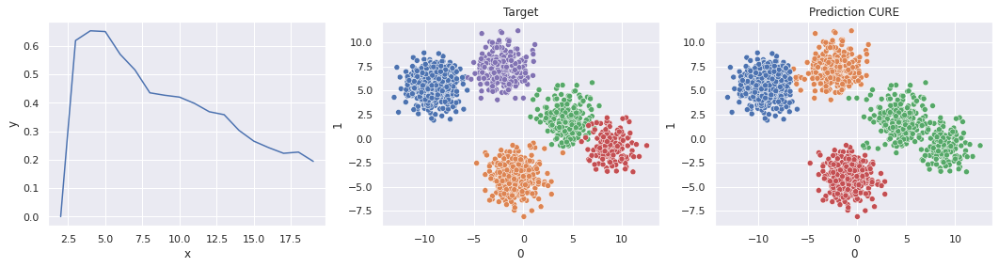

Best K = 4
[CURE]: accuracy 0.9626


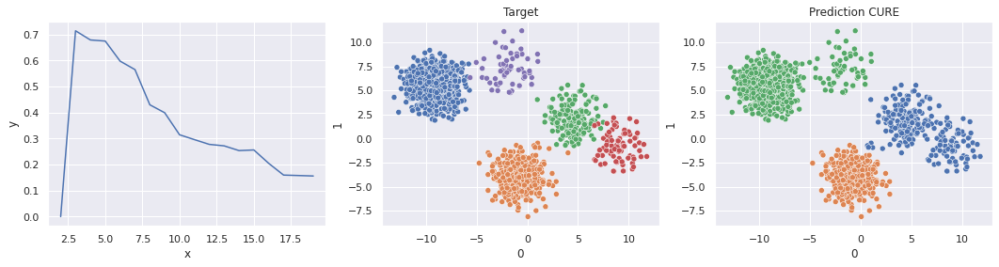

Best K = 3
[CURE]: accuracy 0.9401


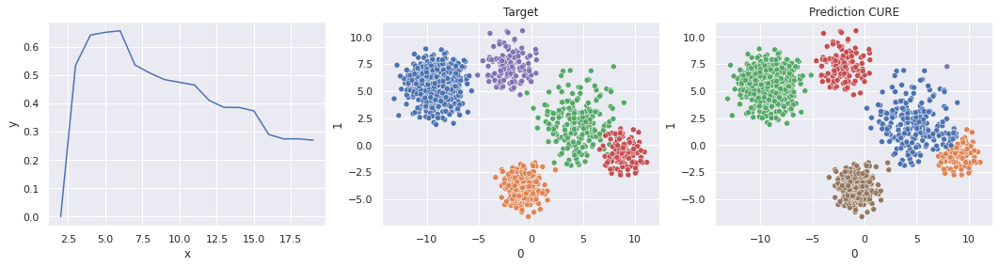

Best K = 6
[CURE]: accuracy 0.9928


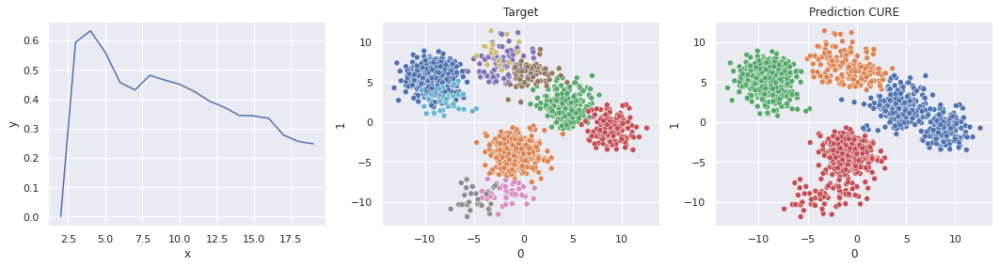

Best K = 4
[CURE]: accuracy 0.9228


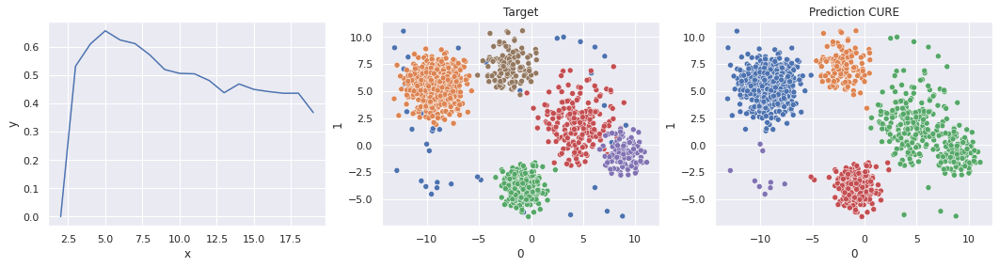

Best K = 5
[CURE]: accuracy 0.9642


In [23]:
run_CURE_on_data(UNBALANCED_GAUSSIAN_BLOBS_DATA, list(range(2, 20)), "UNBALANCED_GAUSSIAN_BLOBS", path=ROOT_DATA)

### Cube

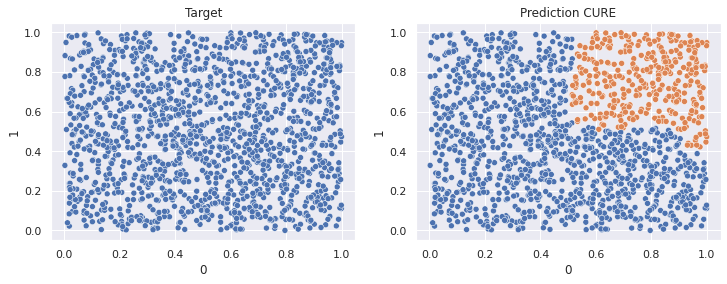

[CURE]: accuracy 0.6363, time 0.188, mem 0.001Mb


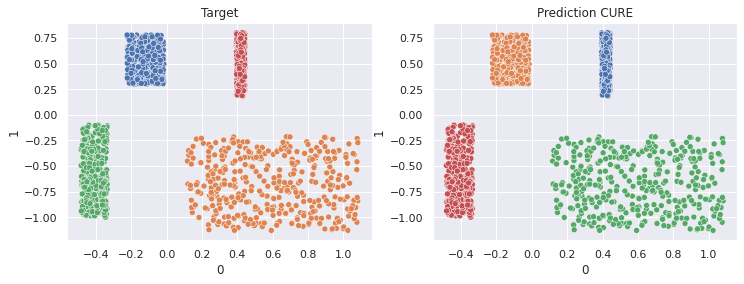

[CURE]: accuracy 1.0000, time 0.189, mem 0.002Mb


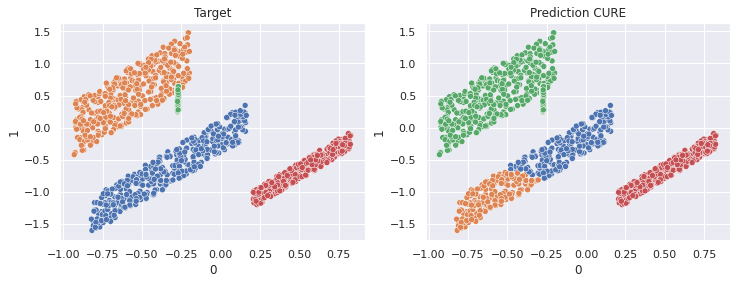

[CURE]: accuracy 0.8440, time 0.182, mem 0.002Mb


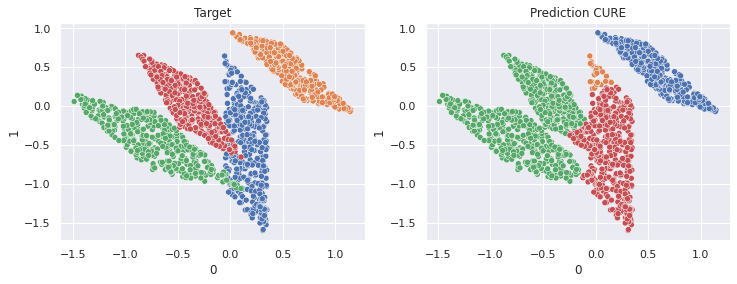

[CURE]: accuracy 0.8419, time 0.314, mem 0.001Mb


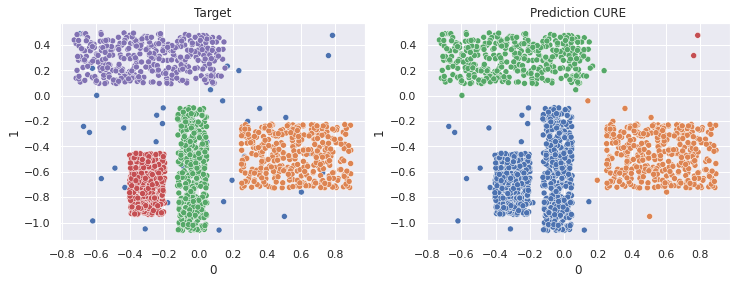

[CURE]: accuracy 0.8606, time 0.176, mem 0.002Mb


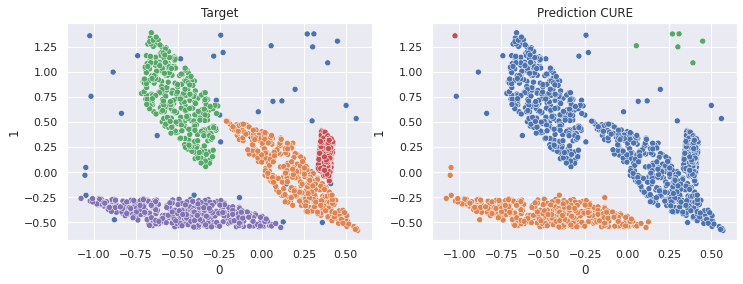

[CURE]: accuracy 0.6188, time 0.182, mem 0.002Mb


In [24]:
run_CURE_on_data_with_K(CUBES_RECT_PARALLEL_DATA, CUBES_RECT_PARALLEL_K, "CUBES_RECT_PARALLEL", path=ROOT_DATA)

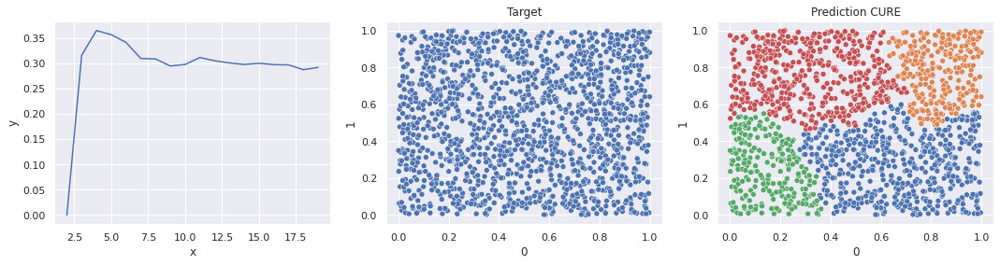

Best K = 4
[CURE]: accuracy 0.2780


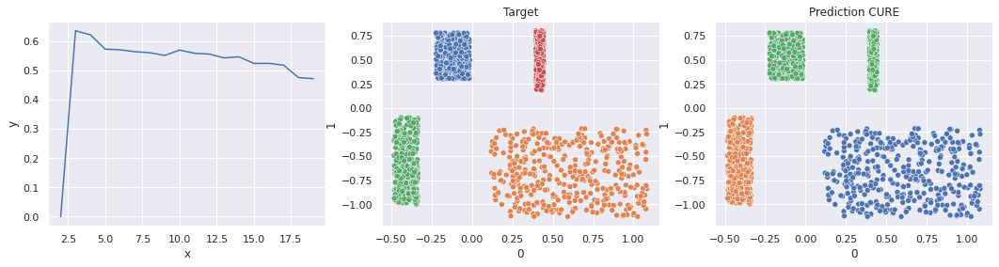

Best K = 3
[CURE]: accuracy 0.8749


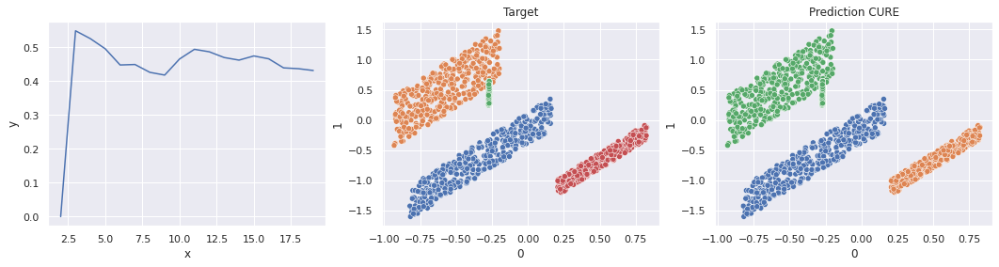

Best K = 3
[CURE]: accuracy 0.8749


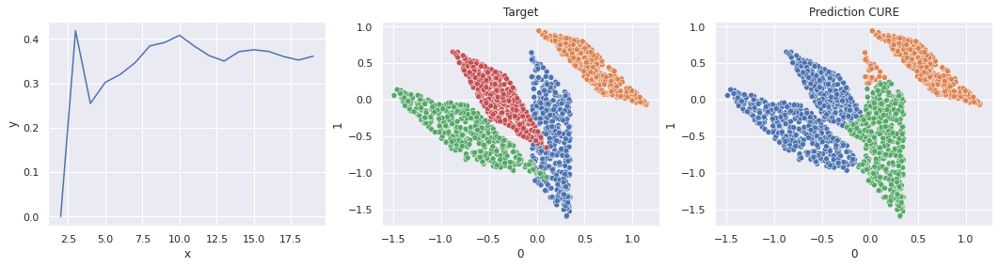

Best K = 3
[CURE]: accuracy 0.8316


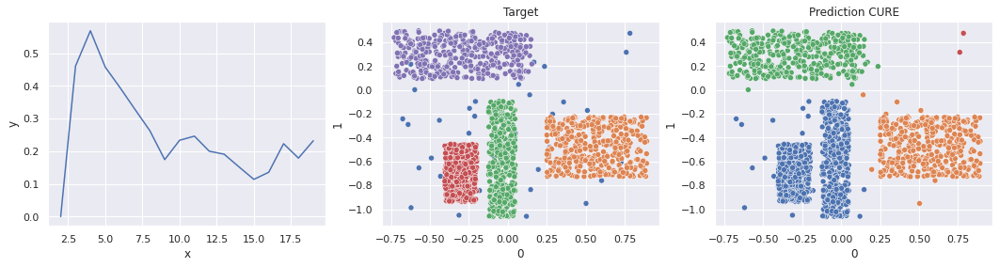

Best K = 4
[CURE]: accuracy 0.8606


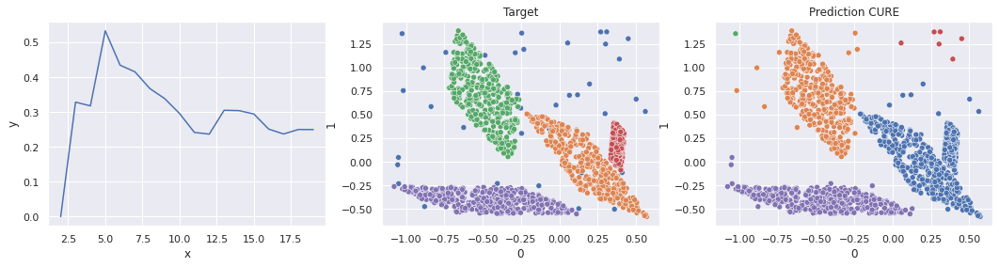

Best K = 5
[CURE]: accuracy 0.8656


In [25]:
run_CURE_on_data(CUBES_RECT_PARALLEL_DATA, list(range(2, 20)), "CUBES_RECT_PARALLEL", path=ROOT_DATA)

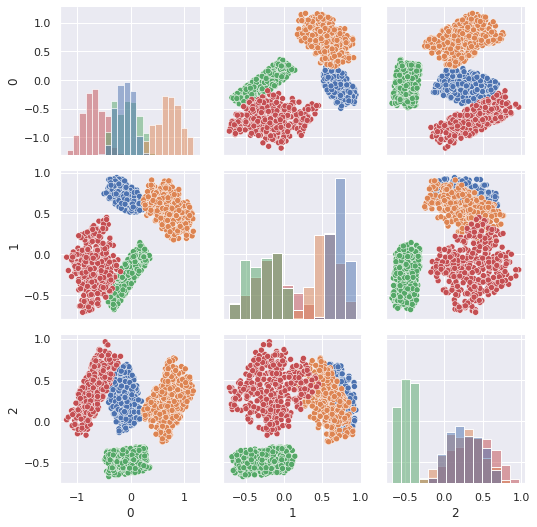

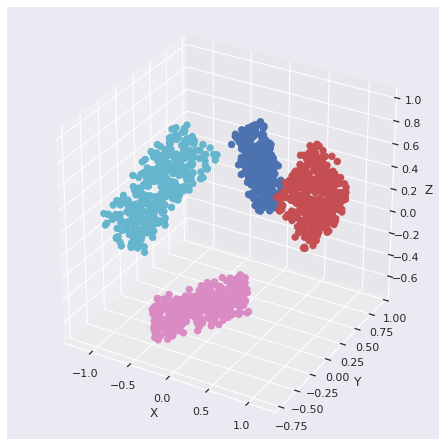

[CURE]: accuracy 0.9941, time 0.216, mem 0.001Mb


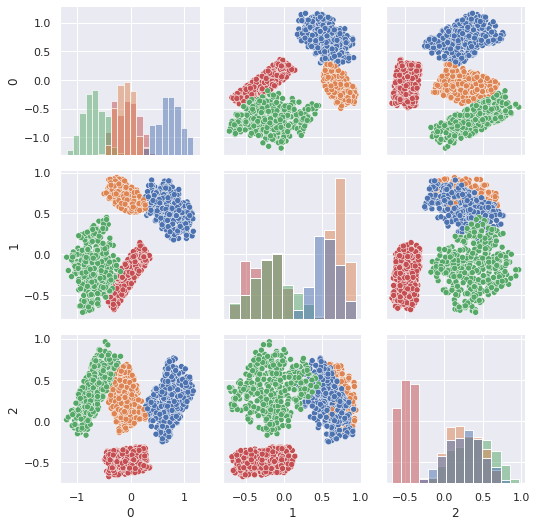

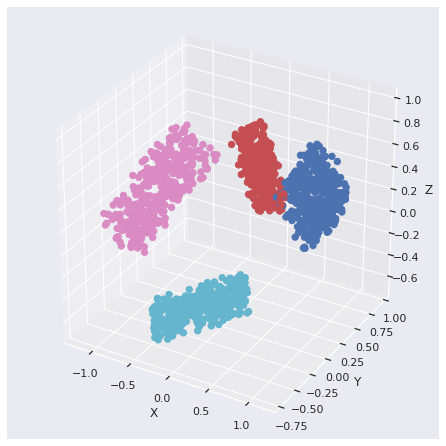

In [26]:
X, y = get_data_cube_3d()
run_on_3d_data(X, y, K=4, data_name="CUBES_RECT_PARALLEL", path=ROOT_DATA)

### Non-spherical

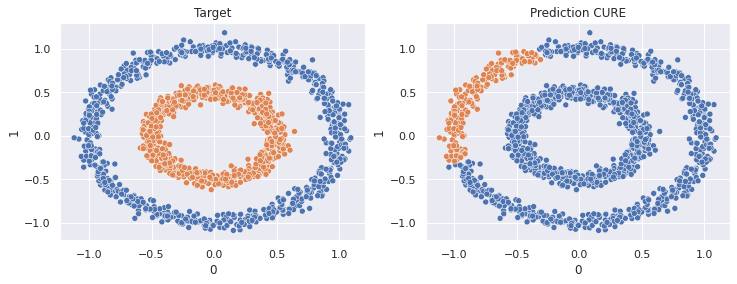

[CURE]: accuracy 0.5308, time 0.362, mem 1.785Mb


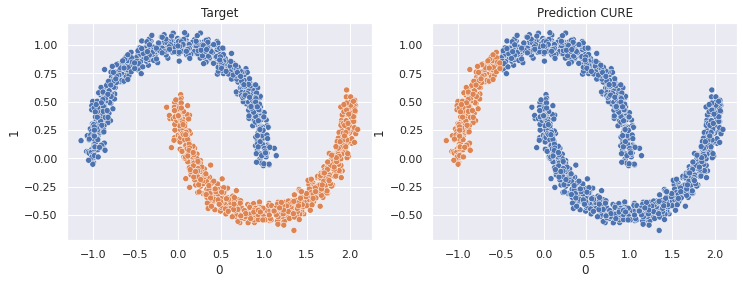

[CURE]: accuracy 0.5553, time 0.197, mem 0.002Mb


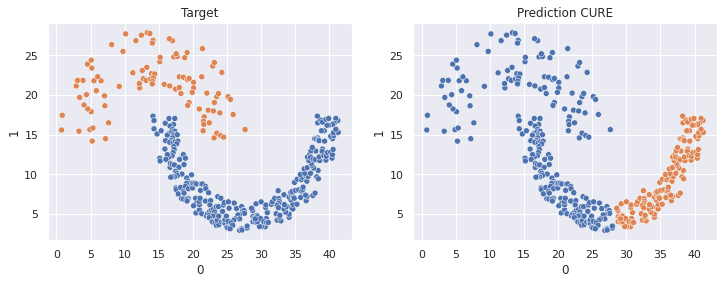

[CURE]: accuracy 0.5235, time 0.021, mem 0.002Mb


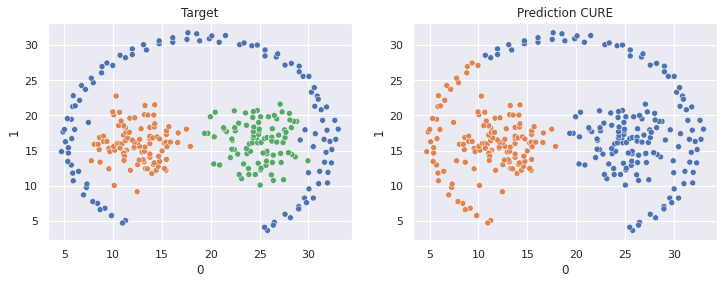

[CURE]: accuracy 0.7067, time 0.021, mem 0.002Mb


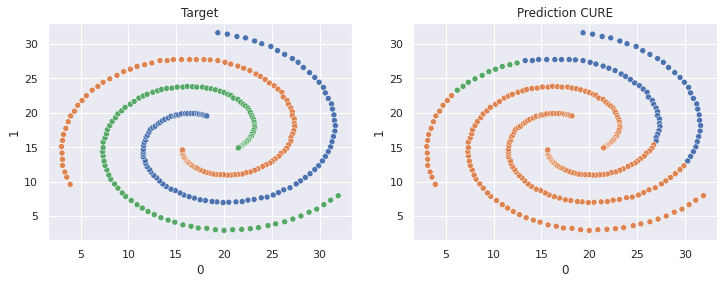

[CURE]: accuracy 0.4951, time 0.025, mem 0.002Mb


In [27]:
run_CURE_on_data_with_K(NON_SPHERICAL_DATA, NON_SPHERICAL_K, "NON_SPHERICAL", path=ROOT_DATA)

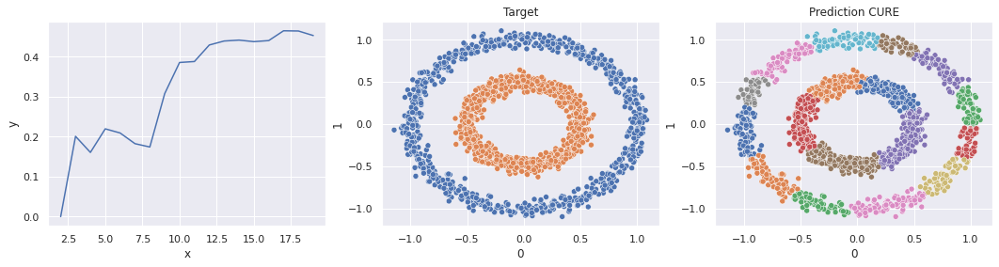

Best K = 17
[CURE]: accuracy 0.5724


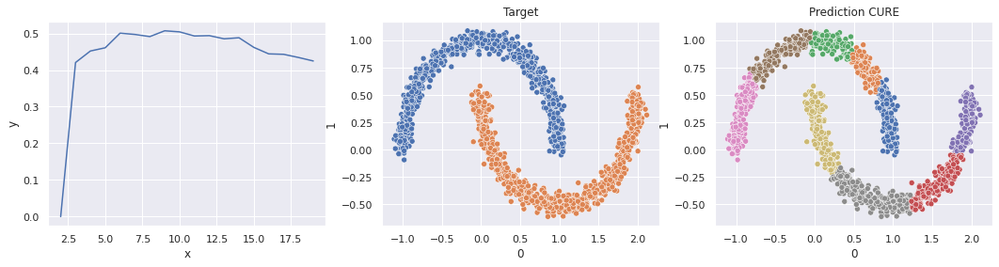

Best K = 9
[CURE]: accuracy 0.6167


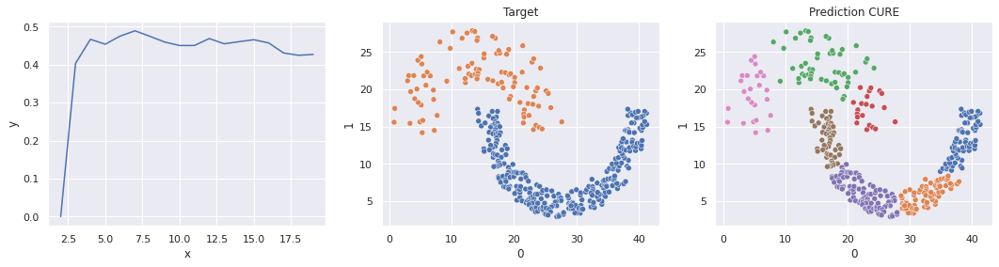

Best K = 7
[CURE]: accuracy 0.5533


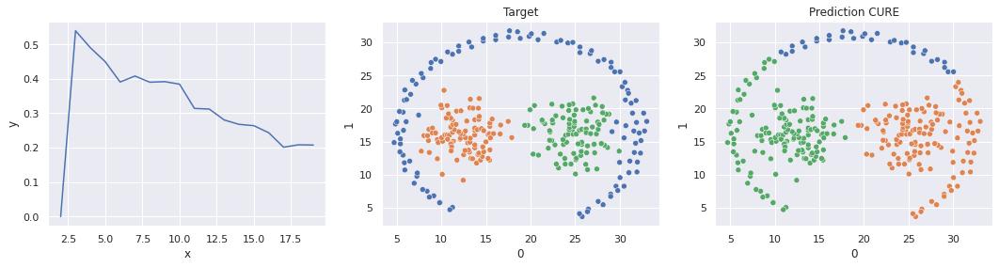

Best K = 3
[CURE]: accuracy 0.7452


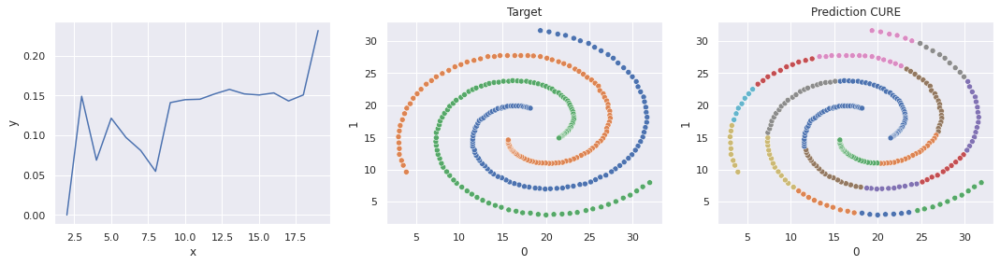

Best K = 19
[CURE]: accuracy 0.7039


In [28]:
run_CURE_on_data(NON_SPHERICAL_DATA, list(range(2, 20)), "NON_SPHERICAL", path=ROOT_DATA)

### Other forms

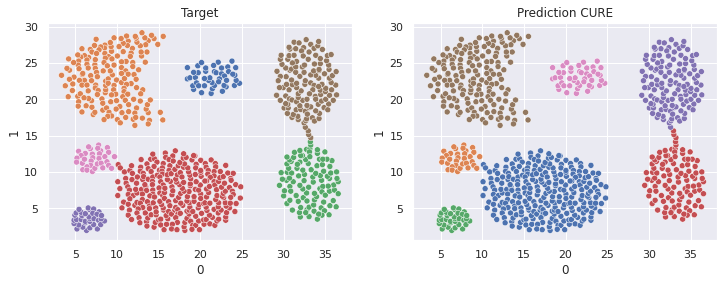

[CURE]: accuracy 0.9978, time 0.082, mem 0.001Mb


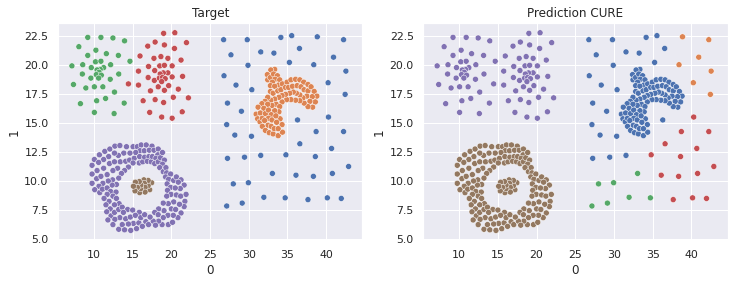

[CURE]: accuracy 0.9103, time 0.031, mem 0.002Mb


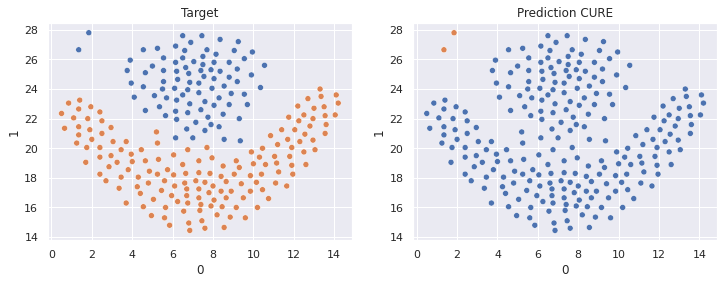

[CURE]: accuracy 0.5406, time 0.017, mem 0.002Mb


In [29]:
run_CURE_on_data_with_K(OTHER_FORMS_DATA, OTHER_FORMS_K, "OTHER_FORMS", path=ROOT_DATA)

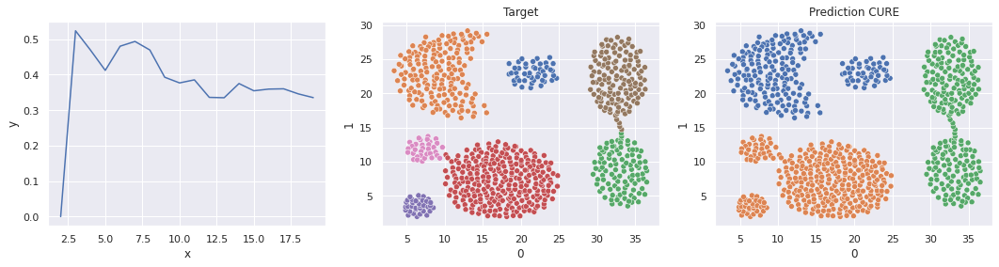

Best K = 3
[CURE]: accuracy 0.8690


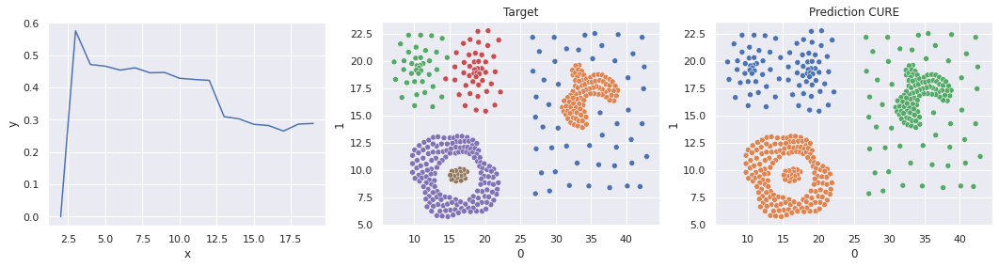

Best K = 3
[CURE]: accuracy 0.8887


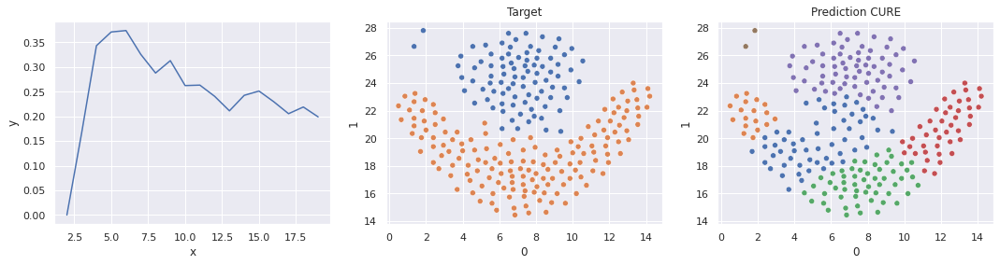

Best K = 6
[CURE]: accuracy 0.6344


In [30]:
run_CURE_on_data(OTHER_FORMS_DATA, list(range(2, 20)), "OTHER_FORMS", path=ROOT_DATA)

### Real dataset (Iris)

In [31]:
import pandas as pd
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

iris = datasets.load_iris()
iris_labels = iris.target
data = pd.DataFrame(iris.data,columns = iris.feature_names)

data.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [32]:
scaler = MinMaxScaler()
data = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

data.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,0.222222,0.625000,0.067797,0.041667
1,0.166667,0.416667,0.067797,0.041667
2,0.111111,0.500000,0.050847,0.041667
3,0.083333,0.458333,0.084746,0.041667
4,0.194444,0.666667,0.067797,0.041667


In [33]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(data)
PCA_iris_data = pd.DataFrame(data = principalComponents , columns = ['pc1', 'pc2','pc3'])

PCA_iris_data.head()

,pc1,pc2,pc3
0,-0.630703,0.107578,-0.018719
1,-0.622905,-0.104260,-0.049142
2,-0.669520,-0.051417,0.019644
3,-0.654153,-0.102885,0.023219
4,-0.648788,0.133488,0.015116


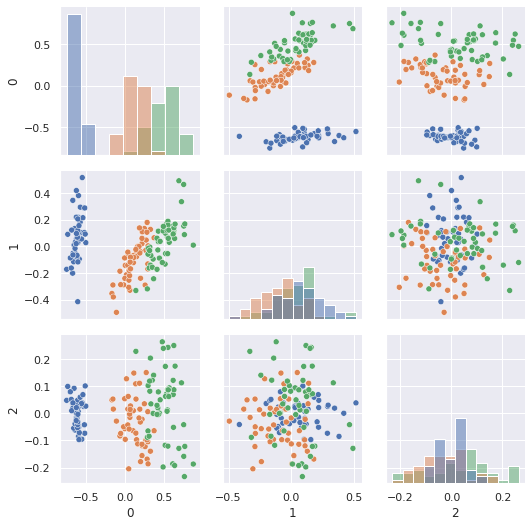

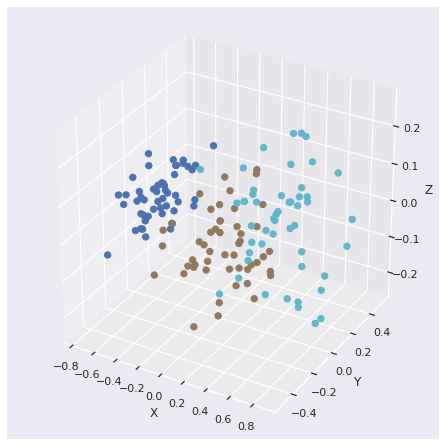

[CURE]: accuracy 0.7719, time 0.010, mem 0.002Mb


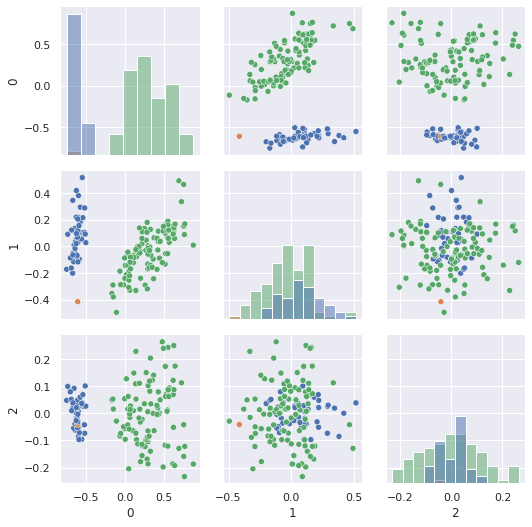

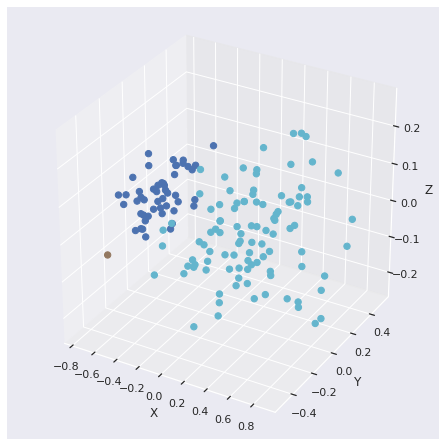

In [34]:
run_on_3d_data(PCA_iris_data.values, iris_labels, 3, data_name="Real_Data", path=ROOT_DATA)

## Time and Memory tests

In [35]:
from cure_utils import evaluation_time_of_working_by_k, evaluation_time_of_working_by_size, evaluation_mem_of_working_by_k, evaluation_mem_of_working_by_size

K_RANGE = [2, 3, 5, 8, 10, 15, 30]

100%|██████████| 7/7 [00:53<00:00,  7.58s/it]


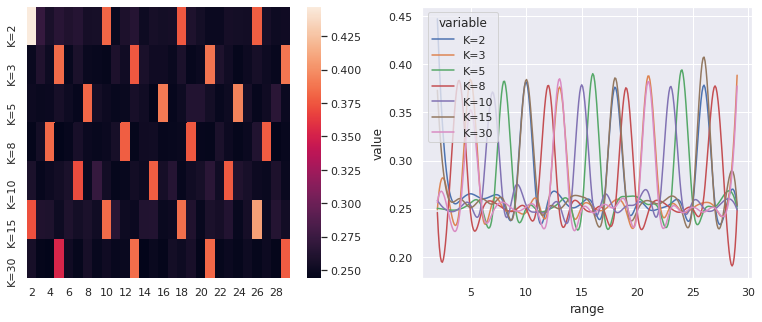

In [36]:
evaluation_time_of_working_by_k(K_RANGE, 
                                total_size=2000, 
                                path=ROOT_DATA)

100%|██████████| 13/13 [02:08<00:00,  9.91s/it]


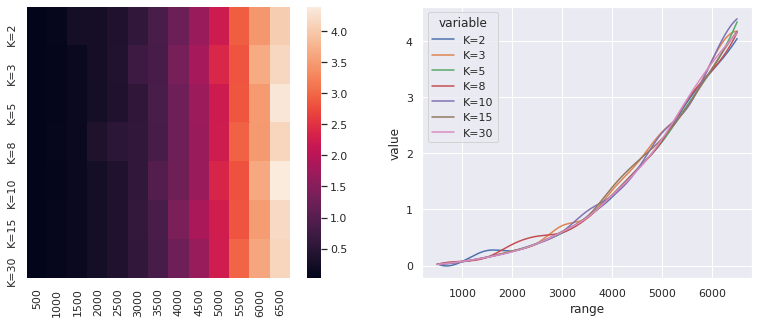

In [37]:
evaluation_time_of_working_by_size(7, 
                                   finding_k = K_RANGE,
                                   path=ROOT_DATA)

100%|██████████| 7/7 [00:56<00:00,  8.03s/it]


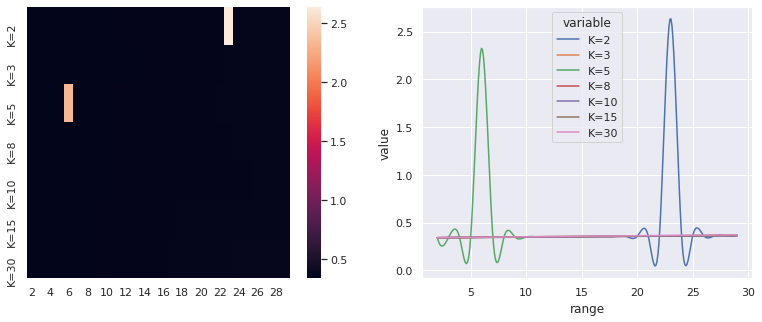

In [38]:
evaluation_mem_of_working_by_k(K_RANGE, 
                                total_size=2000,
                                path=ROOT_DATA)

100%|██████████| 13/13 [02:10<00:00, 10.04s/it]


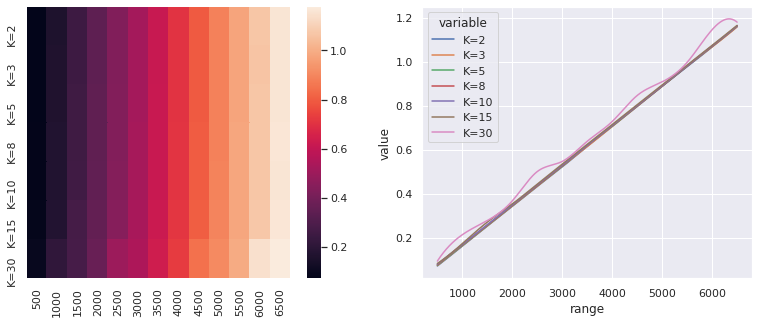

In [39]:
evaluation_mem_of_working_by_size(7, finding_k = K_RANGE, path=ROOT_DATA)

## Check Stability and Initial dependency 

In [40]:
from cure_utils import check_init_dependency, check_stability

100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


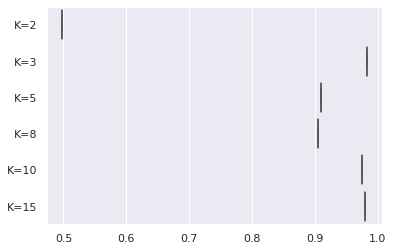

In [41]:
check_init_dependency(path=ROOT_DATA)

100%|██████████| 6/6 [00:11<00:00,  1.95s/it]


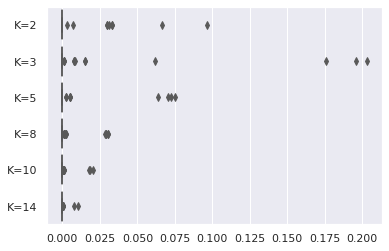

In [42]:
check_stability(path=ROOT_DATA)